# Part 1: Data Analysis
## Chapter 2: Financial Data Structure

In [1]:
import gc
import os

import numpy as np
import pandas as pd
import statsmodels.api as sm
import plotly.graph_objects as go

from afml import general
from afml import bars_generator
from matplotlib import pyplot as plt

def plot_autocorr(title: str, bar_return: np.ndarray, ax):
    sm.graphics.tsa.plot_acf(bar_return, lags=120, ax=ax,
                             alpha=0.05, unbiased=True, fft=True,
                             zero=False, auto_ylims=True,
                             title=title)
    
    plt.tight_layout()  

def returns(prices):
    return prices.pct_change().dropna()

def serial_correlation(returns):
    return returns.autocorr()

### 2.1 On a series of E-mini S&P 500 futures tick data: (I'll use BTC)

#### (a) Form tick, volume, and dollar bars. Use the ETF trick to deal with the roll.


In [3]:
btc_ticks = general.load_transactions_and_generate(
    r"/Volumes/Extreme Pro/transactions/BTCUSDT-trades-2024-.*\.parquet",
    bars_generator.create_tick_bars,
    T=100_000,
)
btc_volume = general.load_transactions_and_generate(
    r"/Volumes/Extreme Pro/transactions/BTCUSDT-trades-2024-.*\.parquet",
    bars_generator.create_volume_bars,
    T=10_000,
)
btc_dollar = general.load_transactions_and_generate(
    r"/Volumes/Extreme Pro/transactions/BTCUSDT-trades-2024-.*\.parquet",
    bars_generator.create_volume_bars,
    T=500_000_000,
    generate_dollar_bars=True
)


100%|██████████| 7/7 [04:19<00:00, 37.14s/it]


#### (b) Count the number of bars produced by tick

In [4]:
def count_samples(df, T):
    if T[-1] == 'm':
        T = T[:-1] + 'min'
    df['dt_time'] = pd.to_datetime(df.index, unit='ms')
    index = df.index
    df.set_index('dt_time', inplace=True)
    resampled_df = df.resample(T).size()
    resampled_df = resampled_df.reset_index(name='count')
    resampled_df['time'] = resampled_df['dt_time']

    del resampled_df['dt_time']
    df.set_index(index, inplace=True)

    return resampled_df

Text(0.5, 1.0, 'BTC moving avg bars per hour')

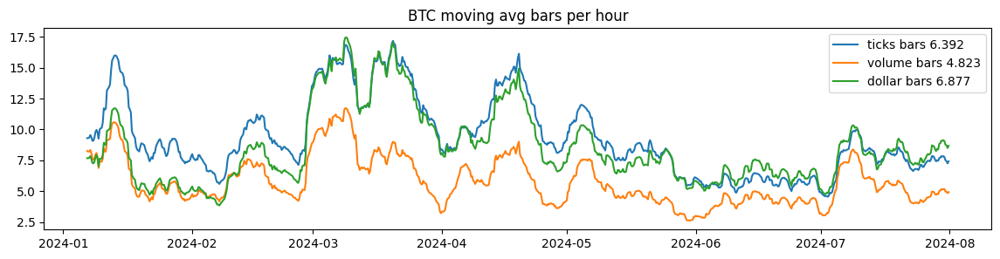

In [5]:
plt.figure(figsize=(14, 3))
count_times = count_samples(btc_ticks, '6h')
plt.plot(count_times['time'], count_times['count'].rolling(window=24).mean(), label=f'ticks bars {np.std(count_times["count"]):.3f}')

count_times = count_samples(btc_volume, '6h')
plt.plot(count_times['time'], count_times['count'].rolling(window=24).mean(), label=f'volume bars {np.std(count_times["count"]):.3f}')

count_times = count_samples(btc_dollar, '6h')
plt.plot(count_times['time'], count_times['count'].rolling(window=24).mean(), label=f'dollar bars {np.std(count_times["count"]):.3f}')
plt.legend(loc='best')
plt.title("BTC moving avg bars per hour")

The windows that im using for each bar is arbitrary but,
`tick bars` has a big variance because every single little trade raise a transaction
`volume bars` is the number of coins that is transfer and is very affected by price of the symbol
`dollar bars` the most stable because its the amount of money that traded, and it represents the actual liquidity of the symbol

#### (c) Serial correlation of returns

In [7]:
print(f'Ticks bars serial correlation {serial_correlation(returns(btc_ticks["close"]))}')
print(f'Volume bars serial correlation {serial_correlation(returns(btc_volume["close"]))}')
print(f'Dollar bars serial correlation {serial_correlation(returns(btc_dollar["close"]))}')

Ticks bars serial correlation -0.03116970187417419
Volume bars serial correlation -0.01548749937639374
Dollar bars serial correlation -0.015245563149263225


/var/folders/x7/1yz0650n6xjf132n6977595h0000gn/T/ipykernel_1430/990181386.py:12: FutureWarning: the 'unbiased' keyword is deprecated, use 'adjusted' instead.
  sm.graphics.tsa.plot_acf(bar_return, lags=120, ax=ax,


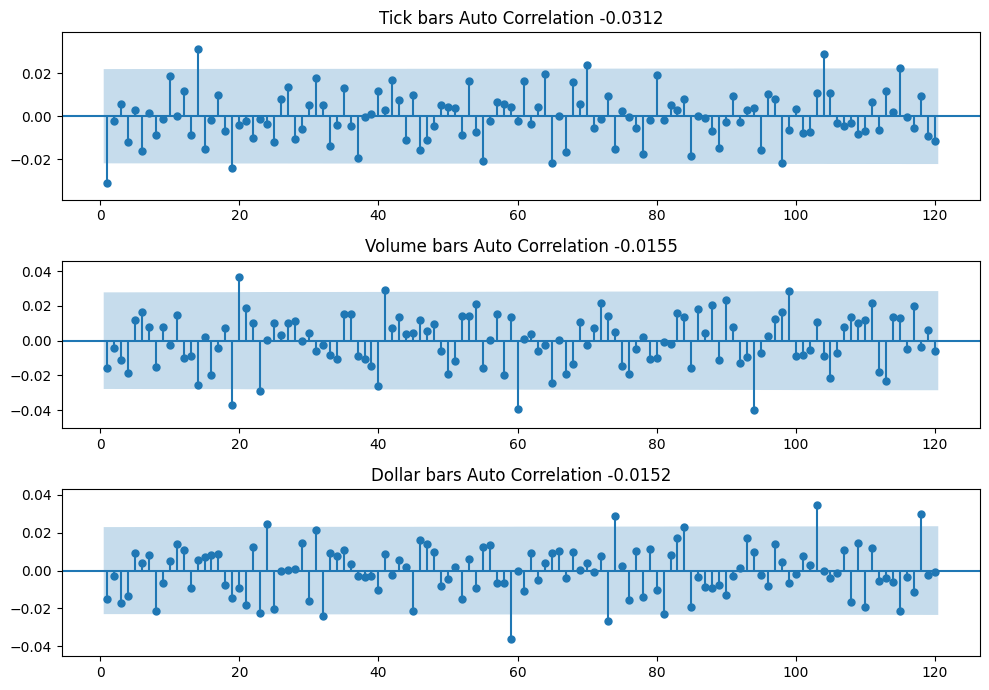

In [8]:
fig, axs = plt.subplots(3, 1, figsize=(10, 7))
plot_autocorr(f'Tick bars Auto Correlation {serial_correlation(returns(btc_ticks["close"])):.4f}',
              returns(btc_ticks["close"]), axs[0])
plot_autocorr(f'Volume bars Auto Correlation {serial_correlation(returns(btc_volume["close"])):.4f}',
              returns(btc_volume["close"]), axs[1])
plot_autocorr(f'Dollar bars Auto Correlation {serial_correlation(returns(btc_dollar["close"])):.4f}',
              returns(btc_dollar["close"]), axs[2])

#### (d) compute the variance for every month

Text(0.5, 1.0, 'BTC variance per week')

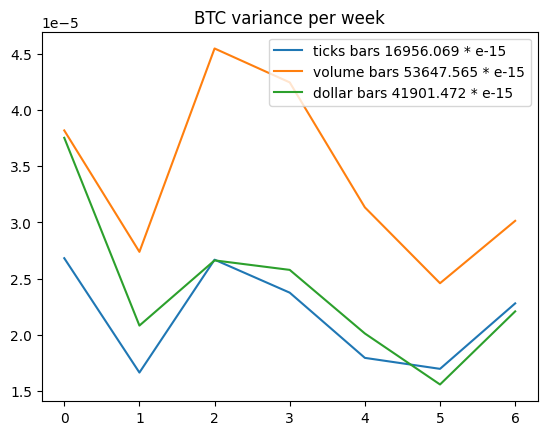

In [9]:
def rolling_variance(df: pd.DataFrame, T: str):
    time_index = df.index
    df['dt_time'] = pd.to_datetime(df.index, unit='ms')
    df.set_index('dt_time', inplace=True)
    variance_df = returns(df['close']).resample(T).var().reset_index()
    variance_df.columns = ['time', 'variance']
    df.reset_index(inplace=True, drop=True)
    df.set_index(time_index, inplace=True)
    return variance_df

rolling_variance_ticks = rolling_variance(btc_ticks, '1ME')
rolling_variance_volume = rolling_variance(btc_volume, '1ME')
rolling_variance_dollar = rolling_variance(btc_dollar, '1ME')


plt.plot(rolling_variance_ticks.index, rolling_variance_ticks['variance'], label=f'ticks bars {np.var(rolling_variance_ticks["variance"])*1e15:.3f} * e-15')
plt.plot(rolling_variance_volume.index, rolling_variance_volume['variance'], label=f'volume bars {np.var(rolling_variance_volume["variance"])*1e15:.3f} * e-15')
plt.plot(rolling_variance_dollar.index, rolling_variance_dollar['variance'], label=f'dollar bars {np.var(rolling_variance_dollar["variance"])*1e15:.3f} * e-15')
plt.legend(loc='best')
plt.title("BTC variance per week")

tick bars exhibit the smallest variance of variances, as for dollar / volume bars the more money that moves than the prices change as well.

#### (d) apply Jarque-Bera normality test

In [10]:
from scipy.stats import jarque_bera

jb_ticks, p_value_ticks = jarque_bera(returns(btc_ticks['close']))
jb_volume, p_value_volume = jarque_bera(returns(btc_volume['close']))
jb_dollar, p_value_dollar = jarque_bera(returns(btc_dollar['close']))

print(f'Ticks bar Jarque-Bera test: {jb_ticks, p_value_ticks}')
print(f'Volume bar Jarque-Bera test: {jb_volume, p_value_volume}')
print(f'Dollar bar Jarque-Bera test: {jb_dollar, p_value_dollar}')

Ticks bar Jarque-Bera test: (np.float64(3850.418373926806), np.float64(0.0))
Volume bar Jarque-Bera test: (np.float64(169.43623118637746), np.float64(1.6120922146900045e-37))
Dollar bar Jarque-Bera test: (np.float64(456.80938504932624), np.float64(6.384139904300673e-100))


Dollar bar has the smallest Jarque-Bera test statistics even though all the bars get a p_value of 0 

In [11]:
# no need for these arrays anymore
del btc_ticks
del btc_volume
gc.collect()

12

### 2.2 Dollar bars & Dollars imbalance bars

In [13]:
btc_imbalance_dollar_bar = general.load_transactions_and_generate(
    r"/Volumes/Extreme Pro/transactions/BTCUSDT-trades-2024-.*\.parquet",
    bars_generator.create_imbalance_dollar_bars,
)

100%|██████████| 7/7 [02:51<00:00, 24.48s/it]


/var/folders/x7/1yz0650n6xjf132n6977595h0000gn/T/ipykernel_1430/990181386.py:12: FutureWarning: the 'unbiased' keyword is deprecated, use 'adjusted' instead.
  sm.graphics.tsa.plot_acf(bar_return, lags=120, ax=ax,


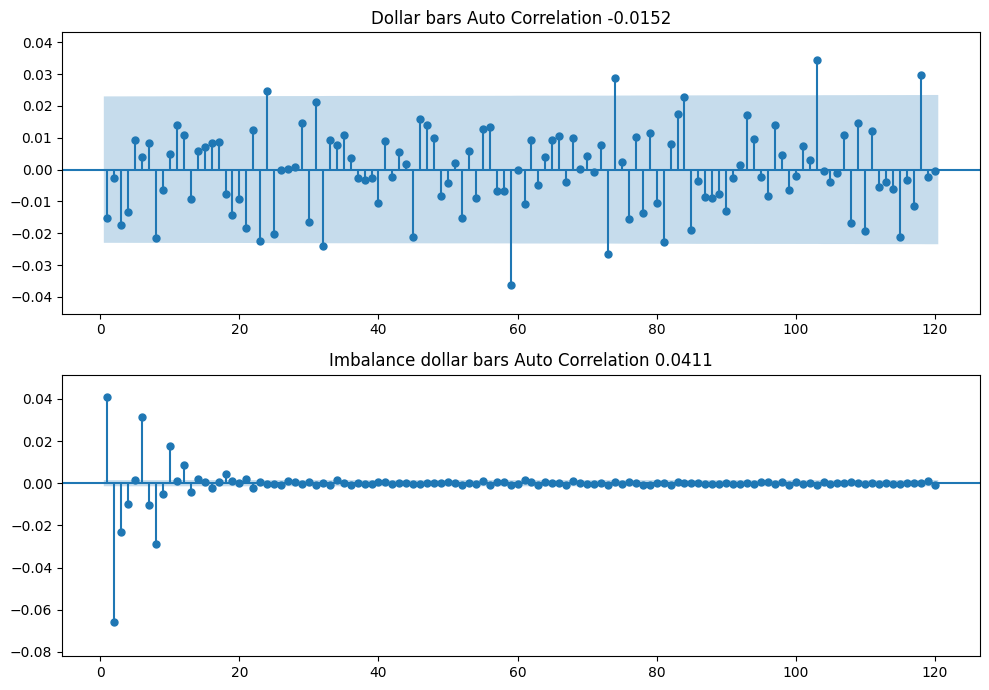

In [14]:
fig, axs = plt.subplots(2, 1, figsize=(10, 7))
plot_autocorr(f'Dollar bars Auto Correlation {serial_correlation(returns(btc_dollar["close"])):.4f}',
              returns(btc_dollar["close"]), axs[0])
plot_autocorr(f'Imbalance dollar bars Auto Correlation {serial_correlation(returns(btc_imbalance_dollar_bar["close"])):.4f}',
              returns(btc_imbalance_dollar_bar["close"]), axs[1])

In [16]:
del btc_imbalance_dollar_bar
del btc_dollar
gc.collect()

### 2.3 ETF Trick on multiple assets

#### Apply PCA on dollar bar on the assets

In [38]:
import importlib
importlib.reload(bars_generator)
from afml import bars_generator

btc_dollar_bar = general.load_transactions_and_generate(
    r"/Volumes/Extreme Pro/transactions/BTCUSDT-trades-2024-05.parquet",
    bars_generator.create_volume_bars,
    T=500_000_000,
    generate_dollar_bars=True
)
eth_dollar_bar = general.load_transactions_and_generate(
    r"/Volumes/Extreme Pro/transactions/ETHUSDT-trades-2024-05.parquet",
    bars_generator.create_volume_bars,
    T=500_000_000,
    generate_dollar_bars=True
)

100%|██████████| 1/1 [00:18<00:00, 18.64s/it]


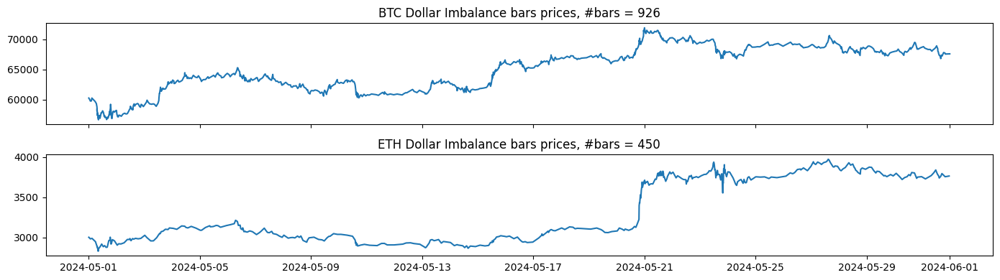

In [39]:
fig, axs = plt.subplots(2, 1, figsize=(14, 4), sharex=True)
axs[0].plot(pd.to_datetime(btc_dollar_bar.index, unit='ms'), btc_dollar_bar['close'])
axs[0].set_title(f"BTC Dollar Imbalance bars prices, #bars = {len(btc_dollar_bar)}")
axs[1].plot(pd.to_datetime(eth_dollar_bar.index, unit='ms'), eth_dollar_bar['close'])
axs[1].set_title(f"ETH Dollar Imbalance bars prices, #bars = {len(eth_dollar_bar)}")

plt.tight_layout()

In [41]:
def pca_weights(cov, riskDist=None, riskTarget=1.0):
    """
    Implementation from the book
    """
    # Following the riskAlloc, distribution, match riskTarget
    eVal, eVec = np.linalg.eigh(cov)  # must be Hermitian
    indices = eVal.argsort()[::-1]  # arguments for sorting eVal desc
    eVal, eVec = eVal[indices], eVec[:, indices]
    if riskDist is None:
        riskDist = np.zeros(cov.shape[0])
        riskDist[-1] = 1.0
    loads = riskTarget * (riskDist / eVal) ** 0.5
    weights = np.dot(eVec, np.reshape(loads, (-1, 1)))

    return weights

def find_closest_indices(df_index, index_series):
    pos = np.searchsorted(df_index, index_series, side='right') - 1
    pos = np.clip(pos, 0, len(df_index) - 1)
    indices = df_index[pos]
    return indices

dollar_bar_prices_indices = np.concatenate([eth_dollar_bar.index.values, btc_dollar_bar.index.values])
dollar_bar_prices_indices.sort()
btc_transactions = general.load_df(r"/Volumes/Extreme Pro/transactions/BTCUSDT-trades-2024-05.parquet")
btc_prices = btc_transactions.groupby('time').last().reset_index()
btc_prices.set_index('time', inplace=True)
btc_prices_indices = find_closest_indices(
    btc_prices.index.values,
    dollar_bar_prices_indices
)

eth_transactions = general.load_df(r"/Volumes/Extreme Pro/transactions/ETHUSDT-trades-2024-05.parquet")
eth_prices = eth_transactions.groupby('time').last().reset_index()
eth_prices.set_index('time', inplace=True)
eth_prices_indices = find_closest_indices(
    eth_prices.index.values,
    dollar_bar_prices_indices
)

prices = pd.DataFrame({
    'BTC': btc_prices.loc[btc_prices_indices, 'price'].values,
    'ETH': eth_prices.loc[eth_prices_indices, 'price'].values,
})
cov = prices[['BTC', 'ETH']].pct_change()[1:].cov()
print(cov)
weights = pca_weights(cov)
weights

          BTC       ETH
BTC  0.000013  0.000013
ETH  0.000013  0.000024


array([[-405.3589075 ],
       [ 274.13123436]])

#### 2.3 (b) Derive the time series spread of BTC/ETH 

<Axes: >

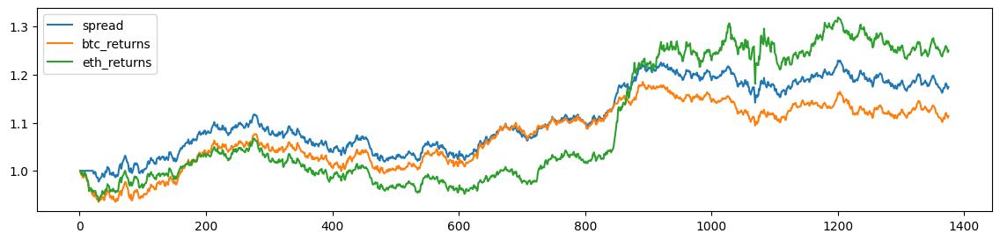

In [55]:
cov = prices[['BTC', 'ETH']].pct_change().rolling(22).cov()
fd = cov.index.levels[0]
weights = pd.Series(fd).apply(lambda x: pca_weights(cov.loc[x]))
split_w = weights.apply(lambda xx:[x[0] for x in xx]).apply(pd.Series)
xx = pd.concat([split_w])
xx.columns = cov.columns
xx = xx.add_suffix('_w')
xx = xx.div(xx.abs().sum(axis=1), axis=0).abs().fillna(0)

prices['BTC_w'] = xx['BTC_w'].values
prices['ETH_w'] = xx['ETH_w'].values
prices['spread_returns'] = prices['BTC'].pct_change() * prices['BTC_w'] + prices['ETH'].pct_change() * prices['ETH_w'] 
prices['btc_returns'] = (1 + prices['BTC'].pct_change()).cumprod() 
prices['eth_returns'] = (1 + prices['ETH'].pct_change()).cumprod() 
prices['spread'] = (1 + prices['spread_returns']).cumprod()
prices[['spread', 'btc_returns', 'eth_returns']].plot(figsize=(14,3))

#### 2.3 (c) check stationary

In [56]:
from statsmodels.tsa import stattools as stt
btc_adf = stt.adfuller(btc_dollar_bar['close'])
eth_adf = stt.adfuller(eth_dollar_bar['close'])

print("BTC dollar bars:")
print('ADF Statistic:', btc_adf[0])
print('p-value:', btc_adf[1])
print('Critical Values:', btc_adf[4])
print('Number of Lags Used:', btc_adf[2])
print('Number of Observations Used:', btc_adf[3])
if btc_adf[1] < 0.05 and btc_adf[0] < btc_adf['5%']:
    print('The btc dollar bars is stationary.')
else:
    print('The btc dollar bars is not stationary.')
    
print()
print("ETH dollar bars:")
print('ADF Statistic:', eth_adf[0])
print('p-value:', eth_adf[1])
print('Critical Values:', eth_adf[4])
print('Number of Lags Used:', eth_adf[2])
print('Number of Observations Used:', eth_adf[3])
if eth_adf[1] < 0.05 and eth_adf[0] < eth_adf['5%']:
    print('The eth dollar bars is stationary.')
else:
    print('The eth dollar bars is not stationary.')

BTC dollar bars:
ADF Statistic: -1.2987801300230333
p-value: 0.6297302207177934
Critical Values: {'1%': np.float64(-3.437439232284603), '5%': np.float64(-2.8646696476686477), '10%': np.float64(-2.5684364181154127)}
Number of Lags Used: 0
Number of Observations Used: 925
The btc dollar bars is not stationary.

ETH dollar bars:
ADF Statistic: -1.0586077915931216
p-value: 0.7312933632062197
Critical Values: {'1%': np.float64(-3.4454029241336483), '5%': np.float64(-2.8681766097362087), '10%': np.float64(-2.570305075326362)}
Number of Lags Used: 12
Number of Observations Used: 437
The eth dollar bars is not stationary.


In [57]:
del btc_transactions
del eth_transactions
del btc_dollar_bar
del eth_dollar_bar
del btc_prices
del eth_prices
del btc_prices_indices
del eth_prices_indices
gc.collect()

7225

### 2.4 Form E-mini S&P 500 futures dollar bars

#### 2.4 (a) compute BB

In [58]:
btc_dollar_bar = general.load_transactions_and_generate(
    r"/Volumes/Extreme Pro/transactions/BTCUSDT-trades-2024-.*\.parquet",
    bars_generator.create_volume_bars,
    T=500_000_000,
    generate_dollar_bars=True
)

100%|██████████| 7/7 [03:06<00:00, 26.66s/it]


In [59]:
def calculate_bollinger_bands(prices, window_size=20, width=0.05):
    moving_average = prices.rolling(window=window_size).mean()
    
    upper_band = moving_average * (1 + width / 2)
    lower_band = moving_average * (1 - width / 2)
    return moving_average, upper_band, lower_band


def bb_crossings(timestamps: np.ndarray, prices: np.ndarray, upper_band: np.ndarray, lower_band: np.ndarray):
    crosses_upper = (prices[:-1] <= upper_band[:-1]) & (prices[1:] > upper_band[1:])
    crosses_lower = (prices[:-1] >= lower_band[:-1]) & (prices[1:] < lower_band[1:])
    
    return timestamps[1:][crosses_lower | crosses_upper]

In [60]:
ma, ub, lb = calculate_bollinger_bands(btc_dollar_bar['close'], window_size=100, width=0.05)

plot_data_points = int(1e5)
_btc_dollar_bar = btc_dollar_bar.iloc[:plot_data_points]
_ma, _ub, _lb = ma[:plot_data_points], ub[:plot_data_points], lb[:plot_data_points]
open_time = pd.to_datetime(_btc_dollar_bar.index, unit='ms')

fig = go.Figure(
    data=[go.Candlestick(x=open_time, open=_btc_dollar_bar['open'],
                         high=_btc_dollar_bar['high'], low=_btc_dollar_bar['low'],
                         close=_btc_dollar_bar['close'], name='BTC Dollar Bars')]
).update_layout(xaxis_title="Time", yaxis_title="Price", title="Dollar Bars with Bollinger Bands")
fig.add_trace(go.Scatter(x=open_time, y=_ma, line=dict(color="blue", width=1), name='MA'))
fig.add_trace(go.Scatter(x=open_time, y=_ub, line=dict(color="gray", width=1), name='Upper Band'))
fig.add_trace(go.Scatter(x=open_time, y=_lb, line=dict(color="gray", width=1), fill = 'tonexty', name='Lower Band'))
fig.show()

/var/folders/x7/1yz0650n6xjf132n6977595h0000gn/T/ipykernel_1430/486404925.py:5: FutureWarning: The behavior of obj[i:j] with a float-dtype index is deprecated. In a future version, this will be treated as positional instead of label-based. For label-based slicing, use obj.loc[i:j] instead
  _ma, _ub, _lb = ma[:plot_data_points], ub[:plot_data_points], lb[:plot_data_points]


In [61]:
bb_crossing_events = bb_crossings(btc_dollar_bar.index.values, btc_dollar_bar["close"].values, ub.values, lb.values)
print(f'Number of crossing ma 100 and bb 5%: {len(bb_crossing_events)} / {len(btc_dollar_bar)}')

Number of crossing ma 100 and bb 5%: 248 / 7262


#### 2.4 (b) cumsum on returns

In [62]:
btc_dollar_bar_returns = returns(btc_dollar_bar['close'])

In [63]:
from afml.data_analyst.financial_data_structures import get_t_events

cumsum_events = get_t_events(btc_dollar_bar.index[1:].values, btc_dollar_bar_returns.values, 0.03)
print(f'Number of crossing cumsum filter with h = 0.0066: {len(cumsum_events)} / {len(btc_dollar_bar)}')

Number of crossing cumsum filter with h = 0.0066: 31 / 7262


#### 2.4 (c) rolling variance the events

<Axes: title={'center': 'Bolling Band Crossing events'}, xlabel='time'>

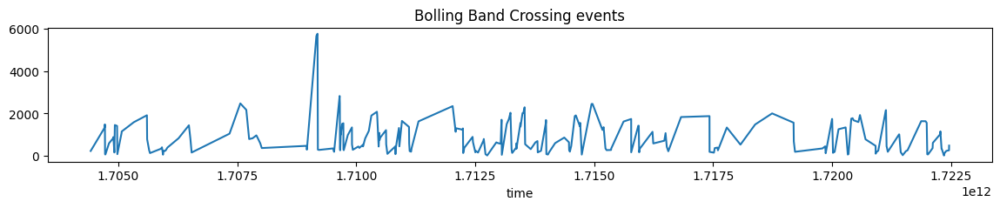

In [64]:
btc_dollar_bar[btc_dollar_bar.index.isin(bb_crossing_events)]['close'].rolling(3).std().plot(title='Bolling Band Crossing events', figsize=(14, 2))

<Axes: title={'center': 'CUMSUM Filter events'}, xlabel='time'>

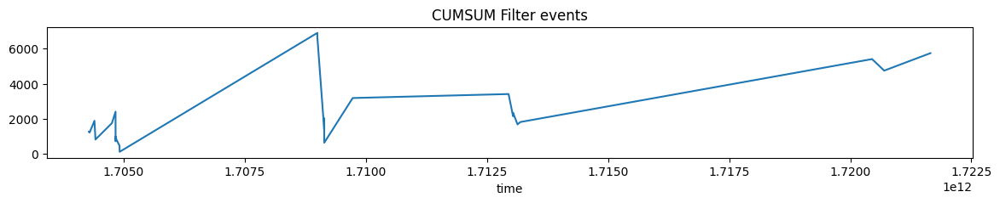

In [65]:
btc_dollar_bar[btc_dollar_bar.index.isin(cumsum_events)]['close'].rolling(3).std().plot(title='CUMSUM Filter events', figsize=(14, 2))

### 2.5 absolute cumsum filter

In [66]:
abs_cumsum_events = get_t_events(btc_dollar_bar.index[1:].values, np.abs(btc_dollar_bar_returns.values), 0.02)
print(f'Number of crossing cumsum filter with h = 0.01: {len(abs_cumsum_events)} / {len(btc_dollar_bar)}')

Number of crossing cumsum filter with h = 0.01: 21 / 7262


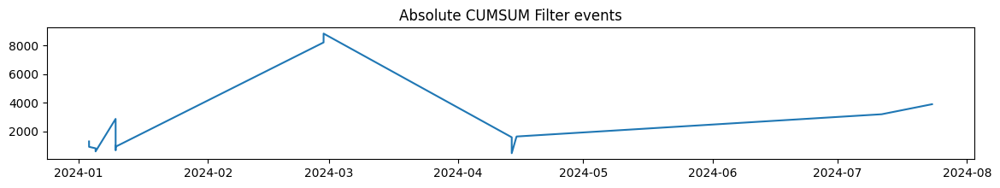

In [67]:
plt.figure(figsize=(14, 2))
plt.title('Absolute CUMSUM Filter events')
plt.plot(pd.to_datetime(abs_cumsum_events, unit='ms'),
         btc_dollar_bar[btc_dollar_bar.index.isin(abs_cumsum_events)]['close'].rolling(3).std()
         )

In [68]:
def scatter_events_on_plot(bars: pd.DataFrame, events: np.ndarray, events_title: str):
    open_time = pd.to_datetime(bars.index, unit='ms')
    fig = go.Figure(
        data=[go.Scatter(x=open_time, y=bars['close'], line=dict(color="blue", width=1), name='price')]
    ).update_layout(xaxis_title="Time", yaxis_title="Price", title="Dollar Bars")
    event_time = pd.to_datetime(events, unit='ms')
    fig.add_trace(go.Scatter(x=event_time, y=bars[bars.index.isin(events)]['close'], mode='markers', name=events_title))
    fig.show()


scatter_events_on_plot(btc_dollar_bar, bb_crossing_events, events_title='bollinger band filter')
scatter_events_on_plot(btc_dollar_bar, cumsum_events, events_title='cumsum filter')
scatter_events_on_plot(btc_dollar_bar, abs_cumsum_events, events_title='abs cumsum filter')

##  Bonus! 

### Determine every bar with different parameters to check what has the most normal and stationary properties
Using BTC transaction since 2021, this generation was made with scripts/bar_generation.py

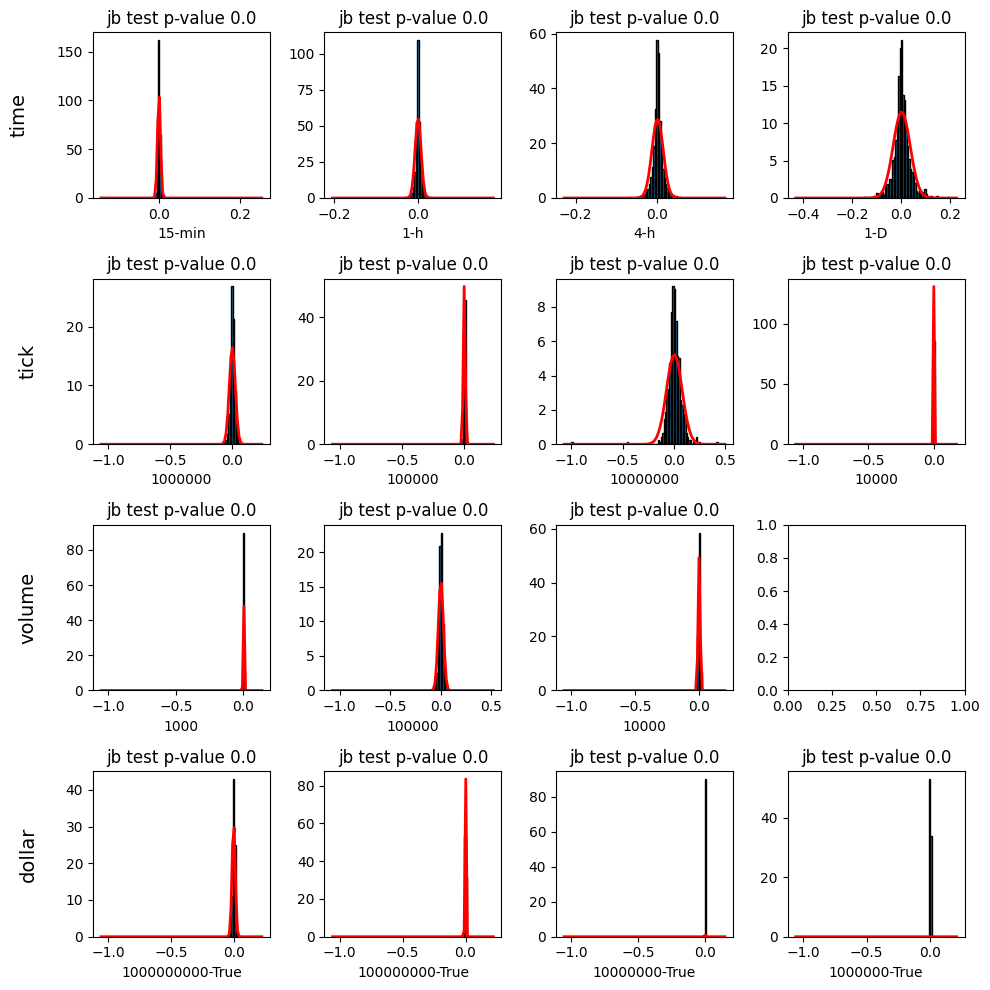

In [24]:
from scipy.stats import norm, jarque_bera

bars = {}
for file in os.listdir('data'):
    if 'bars' not in file:
        continue
    bars[file] = pd.read_parquet(f'data/{file}')

fig, axes = plt.subplots(4, 4, figsize=(10, 10))

row_order = {
    'time': 0,
    'tick': 1,
    'volume': 2,
    'dollar': 3
}

current_col = {0: 0, 1: 0, 2: 0, 3: 0}

# Plot each dataset in the dictionary
for file_name, data in bars.items():
    # Determine the row based on the key
    row = 0
    for _type in row_order:
        if _type in file_name:
            row = row_order[_type]
            break
    col = current_col[row]
    if col == 0:
        axes[row, col].set_ylabel(_type, fontsize=14, labelpad=20)
    current_col[row] += 1

    price_returns = returns(data['close'])
    axes[row, col].hist(price_returns, bins=100, edgecolor='black', density=True)
    axes[row, col].set_xlabel(file_name[len(_type) + len('-bars-'):-len('.parquet')])
    
    mean = np.mean(price_returns)
    std = np.std(price_returns)
    
    xmin, xmax = axes[row, col].get_xlim()
    x = np.linspace(xmin, xmax, 100)
    p = norm.pdf(x, mean, std)
    axes[row, col].plot(x, p, 'r', linewidth=2)
    
    jb_stats, jb_p_value = jarque_bera(price_returns)
    axes[row, col].set_title(f'jb test p-value {jb_p_value}')

fig.tight_layout()

In [79]:
from lightweight_charts import JupyterChart


chart = JupyterChart()
dollar_bars = pd.read_parquet('data/dollar-bars-1000000-True.parquet').iloc[0:10000]
dollar_bars['date'] = pd.to_datetime(dollar_bars.index, unit='ms').floor('s')
dollar_bars = dollar_bars.groupby(dollar_bars['date']).agg({
    'open': 'first',
    'high': 'max',
    'low': 'min',
    'close': 'last',
    'volume': 'sum',
    'vwap': lambda x: (x * dollar_bars.loc[x.index, 'volume']).sum() / dollar_bars.loc[x.index, 'volume'].sum(),
    'date': 'first'  # Keep the first date as the representative date for the group
})

chart.set(dollar_bars)

chart.load()